# **SK[AI] is the limit**
## **Task 3**

If you completed the first parts of the PoC you may try to solve the following question:

Which manuals are missing on the list? Try to perform a clustering of the E-Mails, so that new manual categories can be identified and the Helpdesk team can create such how-to manuals.

**Notebook overview:**

1. Text Representation
  * <font color="red">**tf-idf**</font>
  * **word2vec**
  * **doc2vec**
2. Clustering Algorithm
  * hierarchical clustering
  * lda
  * manifold learning
3. Postprocessing
  * <font color="red"> Word cloud </font>
  *  dataset histogram


  **TODO**
  1. substitute `--`: it is line break I think


In [ ]:
!pip install germalemma
!pip install HanTa
!pip install -U spacy
!python -m spacy download de_core_news_md
!pip install langdetect
!pip install pandas plotnine
!pip install pyLDAvis

Requirement already up-to-date: spacy in /usr/local/lib/python3.6/dist-packages (2.3.2)
✔ Download and installation successful
You can now load the model via spacy.load('de_core_news_md')
     |████████████████████████████████| 1.6MB 5.9MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=c31138c43253695371c2317a7c46416a7ee6c7cf1844b193839f9d0b6c858cb2
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis


In [ ]:
import os

import numpy as np
import pandas as pd

import pandas as pd
import string
import nltk
nltk.download('punkt')

from germalemma import GermaLemma
from HanTa import HanoverTagger as ht
import math
from langdetect import detect
from sklearn.model_selection import GridSearchCV, train_test_split

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram

from nltk import FreqDist, word_tokenize
from wordcloud import WordCloud

import spacy
import de_core_news_md
nlp = de_core_news_md.load()

# lda
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# plotting
import seaborn as sns
import matplotlib.pyplot as plt

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


**Load Data**

In [ ]:
train_df = pd.read_csv('train.csv', sep=";")
test_reduced_df = pd.read_csv('test_reduced.csv', sep=";")

## **Data Preprocessing**

In [ ]:
tagger = ht.HanoverTagger('morphmodel_ger.pgz')

# durchlaufe Preprocess-Pipeline und verwende nur Nomen.
def preprocess(text):
    try:
      text = text.lower()
    except:
      pass
    nouns = []
    try:
        # tokenize in sentences
        sentences = nltk.sent_tokenize(text, language='german')
        sentences_tok = [nltk.word_tokenize(sent, language='german') for sent in sentences]

        for sent in sentences_tok:
            tags = tagger.tag_sent(sent)
            nouns_from_sent = [lemma for (word, lemma, pos) in tags if pos == "NN" or pos == "NE"]
            nouns.extend(nouns_from_sent)
    except TypeError:
        pass
    except KeyError:
        print("KeyError")
        pass
    return " ".join(nouns)


# Verwende alle Worttypen
def preprocessFull(text):
    try:
      text = text.lower()
    except:
      pass
    words = []
    try:
        # tokenize in sentences
        sentences = nltk.sent_tokenize(text, language='german')
        sentences_tok = [nltk.word_tokenize(sent, language='german') for sent in sentences]

        for sent in sentences_tok:
            tags = tagger.tag_sent(sent)
            words_from_sent = [lemma for (word, lemma, pos) in tags]
            words.extend(words_from_sent)    
    except TypeError:
        pass
    except KeyError:
        print("KeyError")
        pass
    return " ".join(words)

def detectLanguage(x):
    try:
        return detect(x)
    except:
        pass

In [ ]:
train_df['subject_lemma_string'] = train_df['MailSubject'].apply(preprocessFull)

In [ ]:
train_df['body_lemma_string'] = train_df['MailTextBody'].apply(preprocessFull)

In [ ]:
train_df['body_lemma_string_part'] = train_df['MailTextBody'].apply(preprocess)

**Create additional variables**

In [ ]:
train_df['MailLanguage'] = train_df['MailTextBody'].apply(detectLanguage)
train_df['body_length'] = train_df['body_lemma_string'].apply(lambda x: len(str(x).split(" ")))
train_df['topic_length'] = train_df['subject_lemma_string'].apply(lambda x: len(str(x).split(" ")))

**Delete non-german emails**

In [ ]:
train_df['MailLanguage'].value_counts()
train_de_df = train_df.loc[train_df['MailLanguage'] == 'de']

print(f"Deleted {len(train_df) - len(train_de_df)} non-german emails")

Deleted 180 non-german emails


In [ ]:
train_de_df["ServiceProcessed"] = train_de_df["ServiceProcessed"].astype('category')
train_de_df["ServiceProcessedEnc"] = train_de_df["ServiceProcessed"].cat.codes

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


**Select only emails that do not have corresponding manuals**

In [ ]:
train_de_noman_df = train_de_df.loc[train_de_df['ManualGroups'].isnull()] 

print(f"{len(train_de_noman_df)} emails (out of {len(train_de_df)}) do not have associated manuals")

1814 emails (out of 2665) do not have associated manuals


## **1. Text representation**

* **tf-idf**
* word2vec
* doc2vec

In [ ]:
vectorizer = TfidfVectorizer(sublinear_tf=True)

# can choose tockenization with a limited number of pos tags
features = vectorizer.fit_transform(train_de_noman_df['body_lemma_string'])

In [ ]:
X_TFIDF = features.toarray()
X_TFIDF.shape

(1814, 11605)

# **1.2 Data visulaization with dimensionality reduction**

* Cluster emails without manuals
* 

In [ ]:
X = X_TFIDF  # can substitute with another text representation of appropriate format

In [ ]:
import umap
#"ServiceProcessed"
fit = umap.UMAP(n_neighbors=5, min_dist=1,  metric='euclidean')
u = fit.fit_transform(X)

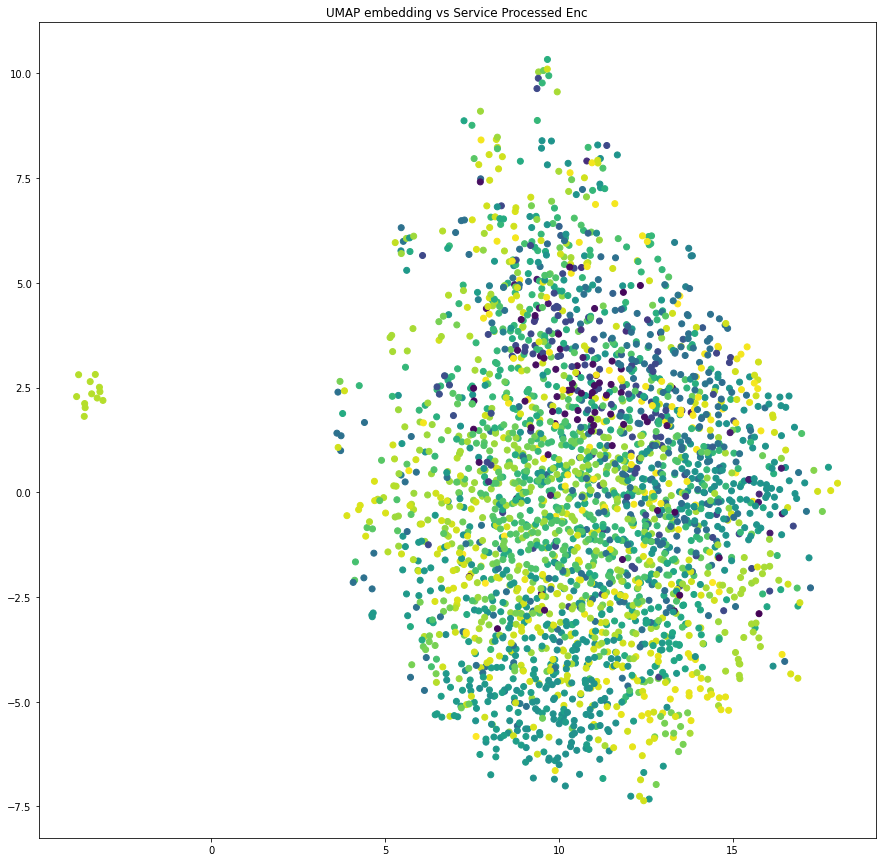

In [ ]:
# shape = cluster
# color = service 
fig = plt.figure(figsize=(15, 15))
plt.scatter(u[:,0], u[:,1], c=train_de_df["ServiceProcessedEnc"])
plt.title('UMAP embedding vs Service Processed Enc');

**Conclusion:** we do not immediately observe any distinct structure in the lower dimensional space. Using a) different representation b) different umap parameters could result in a more pronounced s

## **2. Clustering algorithm**

Links:
* [sklearn clustering](https://scikit-learn.org/stable/modules/clustering.html)

display clusters + manual labels




In [ ]:
inp = X_TFIDF
inp.shape

(1814, 11605)

In [ ]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [ ]:
inp.shape

(1814, 11605)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(inp)

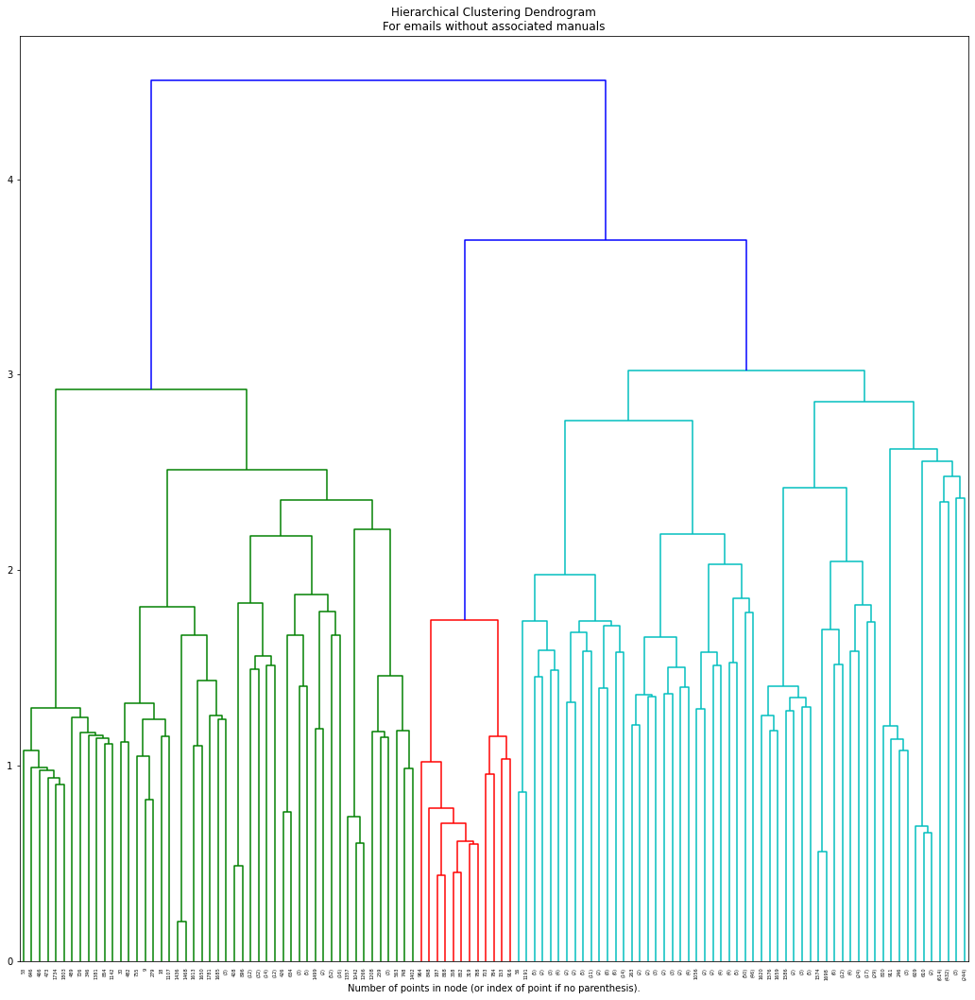

In [ ]:
# display the dendogram to select the number of clusters
fig = plt.figure(figsize=(18, 18))
plt.title('Hierarchical Clustering Dendrogram\nFor emails without associated manuals')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=7) # p=3 'none'
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

**Conclusion:** the dendogram above subbest **18 clusters** might be a reasonable solution.  

In [ ]:
N_CLUST = 18

model2 = AgglomerativeClustering(n_clusters=N_CLUST) # distance_threshold=0, 
model2.fit(inp)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=18)

In [ ]:
len(model2.labels_)#.predict(inp)
train_de_noman_df["labels"] = model2.labels_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# how many emails get clustered as a certain label?
train_de_noman_df["labels"].value_counts()

6     614
4     223
8     209
1     193
2     153
3     133
14     94
13     66
7      39
10     16
11     14
9      12
16     12
5      12
0      11
15      6
17      4
12      3
Name: labels, dtype: int64

In [ ]:
#from sklearn import metrics

#m1 = metrics.adjusted_mutual_info_score(true_labels, predicted_labels)  
#m2 = metrics.homogeneity_score(true_labels, predicted_labels)
#m3 = metrics.completeness_score(true_labels, predicted_labels)

#print(f"Metrics\nrand: {m1}, homogeneity: {m2}, completeness: {m3}")

In [ ]:
#metrics.silhouette_score(train_de_df["ServiceProcessedEnc"], model2.labels_, metric='euclidean')

## **3. Postprocessing**

Visualize suggested clusters 

* **word cloud**
* **values of other categorical values**
* **labeling using transformers**

In [ ]:
CLUSTER_LABELS = np.unique(train_de_noman_df["labels"])

6

In [ ]:
GROUP_NUM = CLUSTER_LABELS[6]         # SELECT CLUSTER GROUP TO CHARACTERIZE
sentence_group = train_de_noman_df.loc[train_de_noman_df["labels"] == GROUP_NUM]

print(f"Group {GROUP_NUM} includes {len(sentence_group)} elements")

Group 6 includes 614 elements


In [ ]:
sentence_group['body_lemma_string'] = sentence_group['body_lemma_string'].apply(lambda x: str(x).lower())
sentence_group['body_lemma_string_part'] = sentence_group['body_lemma_string_part'].apply(lambda x: str(x).lower())

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
from nltk import FreqDist, word_tokenize
from wordcloud import WordCloud

In [ ]:
# FreqDist(all_words)
nltk.download('stopwords')
from nltk.corpus import stopwords
german_stop_words = stopwords.words('german')
german_stop_words.extend(["grüsse", "dank", "herr", "gut", "freundlich", 
                          "liebe", "lieber", "lg", "--", "3", "2", "1", "0", "tag",
                          "vielen", "geehrt", "dame", "mehr", "frau", "%", "kollegin", "kollege"])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


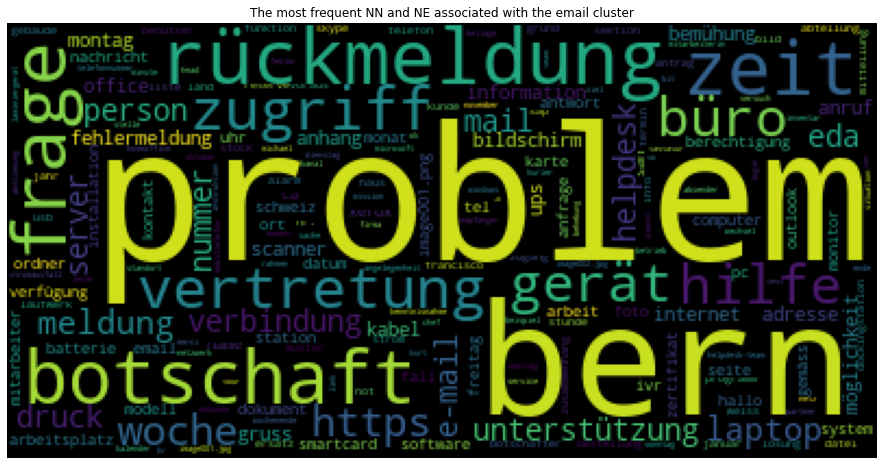

In [ ]:
all_words = " ".join(sentence_group['body_lemma_string_part']).split(" ")
all_words_filt = list(filter(lambda x: x not in german_stop_words, all_words)) 

frequency_dist = FreqDist(all_words_filt)
wordcloud = WordCloud().generate_from_frequencies(frequency_dist)

plt.figure(figsize=(16,8))
plt.imshow(wordcloud)
plt.title("The most frequent NN and NE associated with the email cluster")
plt.axis("off")
plt.show()

**Conclusion:** an interesting imrovement would be to explore the selection of relevant **POS** tags more

In [ ]:
# Try to infer the general sentiment of sentendes => does not work
import spacy
import de_core_news_md
nlp = de_core_news_md.load()

sentence_group["sentiment"] = sentence_group['body_lemma_string'].apply(lambda x: nlp(x).sentiment )
min(sentence_group["sentiment"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0.0

**Visulaize the values of other categorical variables in the cluster**

In [ ]:
CATEG_VARS_SHORT = ['Impact', 'Urgency', 'IncidentType']
CATEG_VARS_LONG = ['Impact', 'Urgency', 'IncidentType', 'ServiceProcessed']

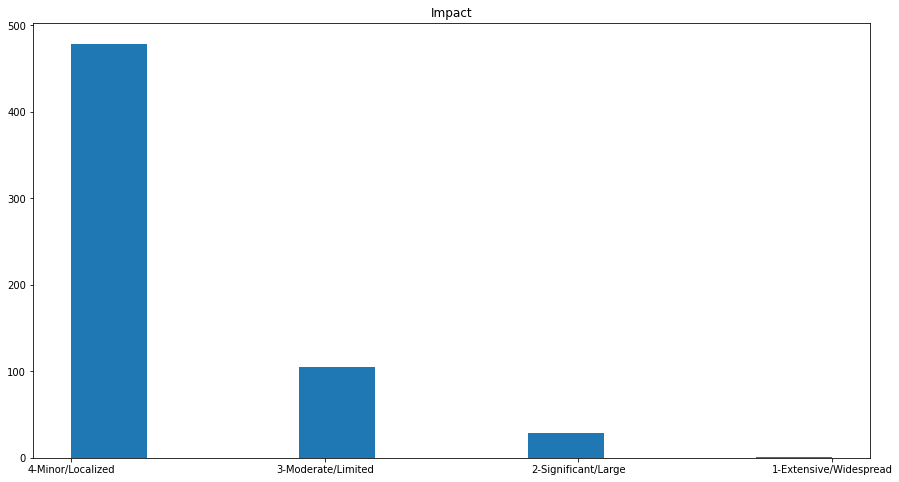

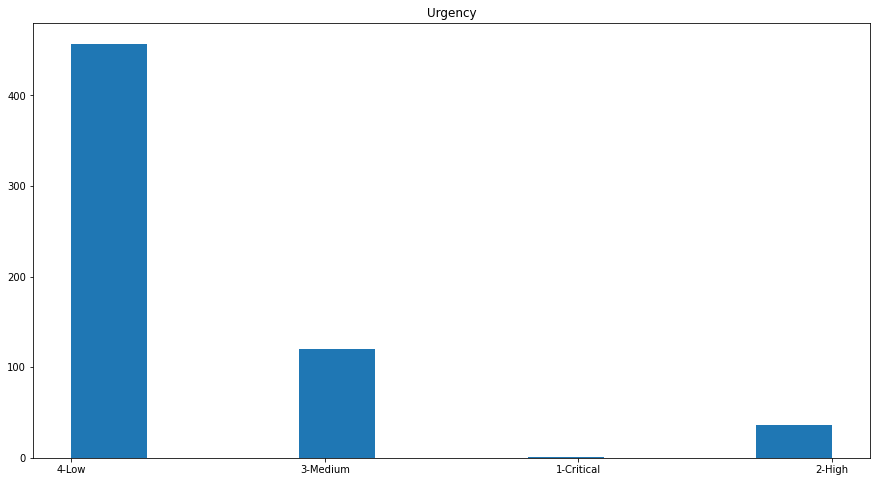

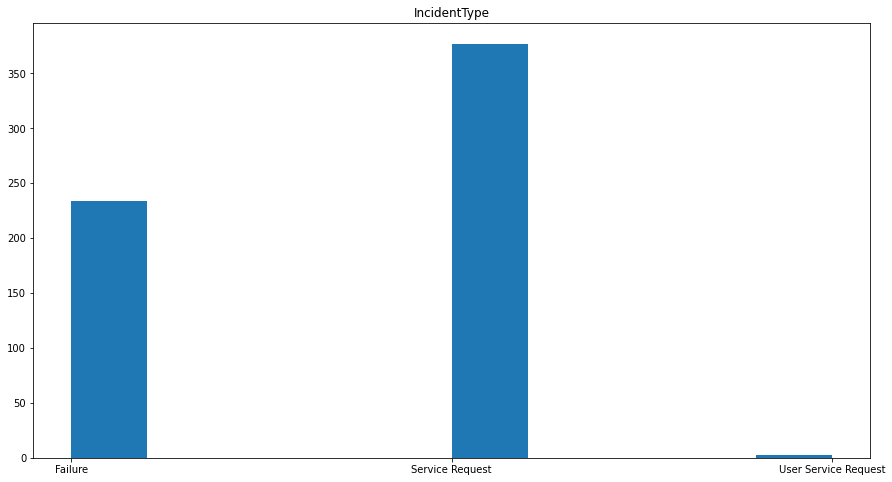

In [ ]:
#rows, cols = (2, 3)
#fig, axs = plt.subplots(rows, cols, figsize=(15, 5))

# TODO: add other bar that corresponds to general distribution

for i, var in enumerate(CATEG_VARS_SHORT):
  fig = plt.figure(figsize=(15, 8))
  plt.title(var)
  plt.hist(sentence_group[var])
  plt.show()

In [ ]:
# OLDER dataset exploration
train_df['ManualGroups'].dropna().value_counts()

fig = plt.figure(figsize=(8,8))
plt.hist(train_df['ManualGroups'].dropna().value_counts(), bins=20)
plt.show()

Smart_Device___MDM                                    120
Benutzeranleitungen_Telefonie                          87
Notebook                                               76
Drucker___Multifunktionsgeräte_                        52
Outlook                                                51
                                                     ... 
Word|Outlook                                            1
CodX_PostOffice|Drucker___Multifunktionsgeräte_         1
Benutzeranleitungen_Telefonie|Informatiksicherheit      1
Standalone|Outlook                                      1
eSysp___Biometrie|Informatiksicherheit                  1
Name: ManualGroups, Length: 63, dtype: int64

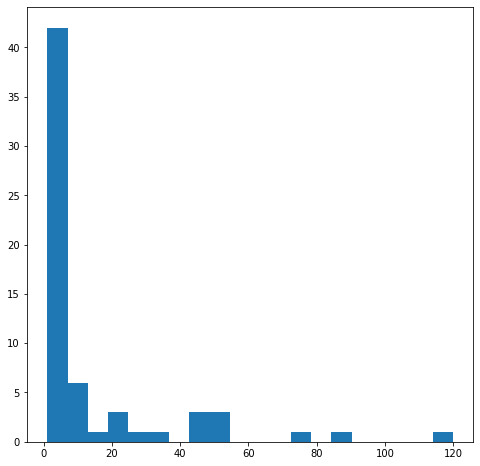

# **Approach 2: LDA topic modelling**

* [gensim example](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/)

In [ ]:
!pip install pyLDAvis

In [ ]:
german_stop_words = stopwords.words('german')
german_stop_words.extend(["grüsse", "dank", "herr", "gut", "freundlich", 
                          "liebe", "lieber", "lg", "--", "3", "2", "1", "0", "tag",
                          "vielen", "geehrt", "dame", "mehr", "frau", "%"])

print(f"Number of stopwords: {len(german_stop_words)}")

Number of stopwords: 252


In [ ]:
train_de_noman_df['body_lemma_string_vec'] = train_de_noman_df['body_lemma_string'].apply(lambda x: str(x).lower().split(" "))
train_de_noman_df['body_lemma_string_part_vec'] = train_de_noman_df['body_lemma_string_part'].apply(lambda x: str(x).lower().split(" "))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


**9. Creating Bigram and Trigram Models**

In [ ]:
data_words = train_de_noman_df['body_lemma_string_part_vec'] .copy()
#data_words 

In [ ]:
import gensim
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=15) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=15)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

/usr/local/lib/python3.6/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


['computer', 'smartcard', 'smardcard', 'sitzung', 'büro', 'lg']


**10. Remove Stopwords, Make Bigrams and Lemmatize**

In [ ]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word.lower() for word in doc if word.lower() not in german_stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [ ]:
#data_words_bigrams[0]

**11. Create the Dictionary and Corpus needed for Topic Modeling**

In [ ]:
from gensim import corpora

# Create Dictionary
id2word = corpora.Dictionary(data_words_bigrams)

# Create Corpus
texts = data_words_bigrams

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])


[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)]]


In [ ]:
#id2word[10]
#corpus   # very long output

In [ ]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('büro', 1),
  ('computer', 1),
  ('sitzung', 1),
  ('smardcard', 1),
  ('smartcard', 1)]]

**12. Building the Topic Model**

In [ ]:
# select number of topics
NUM_TOPICS_GRID = [2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20 ]

df_lda = pd.DataFrame(columns = ["topics", "preplexity", "coherence"])
df_lda["topics"] = NUM_TOPICS_GRID
#df_lda

In [ ]:
# Build LDA model
from pprint import pprint
from gensim.models import CoherenceModel


for num_topics in NUM_TOPICS_GRID:
  print(f"Number of topics {num_topics}")
  lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=num_topics, 
                                            random_state=100,
                                            update_every=1,
                                            chunksize=100,
                                            passes=10,
                                            alpha='auto',
                                            per_word_topics=True)
  print("computing preplexity")
  df_lda.loc[df_lda["topics"] == num_topics, "preplexity"] = lda_model.log_perplexity(corpus)
  print("computing coherence")
  coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
  df_lda.loc[df_lda["topics"] == num_topics, "coherence"] = coherence_model_lda.get_coherence()


#print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
#coherence_lda = coherence_model_lda.get_coherence()

Number of topics 2


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 3


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 4


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 5


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 6


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 7


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 8


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 9


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 10


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 15


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence
Number of topics 20


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing preplexity


/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

computing coherence


In [ ]:
df_lda

,topics,preplexity,coherence
0,2,-7.99793,0.293309
1,3,-8.09498,0.342834
2,4,-8.19421,0.36434
3,5,-8.28255,0.415987
4,6,-8.29896,0.389994
5,7,-8.31179,0.397418
6,8,-8.33055,0.388984
7,9,-8.35106,0.409533
8,10,-8.35836,0.412045
9,15,-8.41537,0.47124


<Figure size 720x576 with 0 Axes>

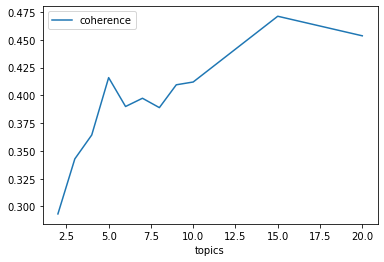

In [ ]:
fig = plt.figure(figsize=(10, 8))
df_lda.plot.line(x="topics", y="coherence") # [[ "topics", "coherence"]].plot()
plt.show()

**Conclusion:** select the modes with the highest coherence score => either **15** or **5** topics

In [ ]:
num_topics_fin = 5

lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                            id2word=id2word,
                                            num_topics=num_topics_fin, 
                                            random_state=100,
                                            update_every=1,
                                            chunksize=100,
                                            passes=10,
                                            alpha='auto',
                                            per_word_topics=True)

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

**13. View the topics in LDA model**

In [ ]:
from pprint import pprint
from gensim.models import CoherenceModel

pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.032*"pc" + 0.016*"eröffnen" + 0.016*"pro" + 0.013*"dienstag" + '
  '0.011*"rahmen" + 0.008*"20" + 0.008*"all" + 0.008*"stelle" + 0.008*"statt" '
  '+ 0.007*"stereo"'),
 (1,
  '0.019*"sowie" + 0.016*"verfügen" + 0.013*"ev" + 0.011*"beschaffen" + '
  '0.010*"asset-id" + 0.010*"sicherheit" + 0.010*"privat" + 0.009*"sicher" + '
  '0.009*"französisch" + 0.009*"flash"'),
 (2,
  '0.218*"--" + 0.106*">" + 0.093*"https" + 0.080*"//www.admin.ch" + '
  '0.025*"sent" + 0.024*"subject" + 0.023*"from" + 0.013*"pm_to" + 0.011*"to" '
  '+ 0.008*"re"'),
 (3,
  '0.035*"muster" + 0.033*"installation" + 0.023*"max" + 0.018*"client" + '
  '0.016*"standort" + 0.015*"bit" + 0.015*"karte" + 0.013*"latitude" + '
  '0.012*"leser" + 0.010*"bedanken"'),
 (4,
  '0.078*"erscheinen" + 0.033*"bild" + 0.020*"helpdesk_team" + '
  '0.018*"berechtigung" + 0.016*"1." + 0.013*"trotz" + 0.013*"herstellen" + '
  '0.013*"fehlermeldung" + 0.012*"betrieb" + 0.011*"feld"'),
 (5,
  '0.187*"2" + 0.178*"1" + 0.177*"3" + 0

**15. Visualize the topics-keywordst**

In [ ]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.310568  0.027642       1        1  32.362059
1     -0.053538 -0.258967       2        1  19.597098
3     -0.044041  0.035614       3        1  16.058561
0     -0.106219  0.027651       4        1  16.035578
2     -0.106770  0.168060       5        1  15.946705, topic_info=             Term        Freq       Total Category  logprob  loglift
5      bildschirm  304.000000  304.000000  Default  30.0000  30.0000
143       problem  341.000000  341.000000  Default  29.0000  29.0000
106           ivr  111.000000  111.000000  Default  28.0000  28.0000
40    rückmeldung  142.000000  142.000000  Default  27.0000  27.0000
2257      windows   99.000000   99.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
147      internet   19.600998   20.273106   Topic5  -5.2050   1.8022
769    department   20.739940   21.460020   Topic5  -5.1486   1.8018
4       smartcard   44.752674   55.293971   Topic5  -4.3795   1.6244
337         frage   32.872785   71.468989   Topic5  -4.6880   1.0593
487          fall   26.367274   49.555827   Topic5  -4.9085   1.2049

[215 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
154       4  0.987404   abteilung
140       4  0.974639     adresse
4849      2  0.981505       agent
703       4  0.943174     andreas
428       3  0.987071     anfrage
...     ...       ...         ...
139       1  0.996364        zeit
353       5  0.988207  zertifikat
355       5  0.988464      zugang
115       1  0.969879     zugriff
115       2  0.025692     zugriff

[215 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 4, 1, 3])

**17. How to find the optimal number of topics for LDA?**

My approach to finding the optimal number of topics is to build many LDA models with different values of number of topics (k) and pick the one that gives the highest coherence value.

In [ ]:
service_df = pd.DataFrame.from_dict(service_dict)

In [ ]:
corrMatrix = service_df.corr()

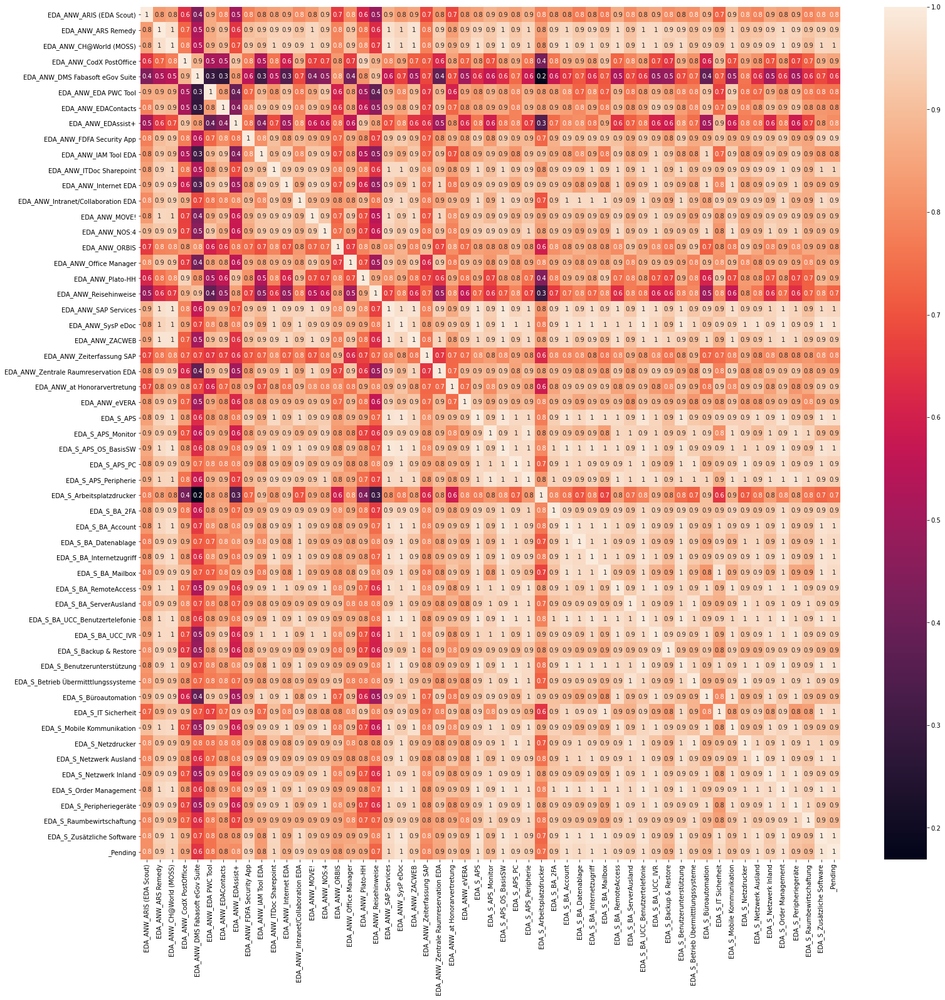

In [ ]:
fig = plt.figure(figsize=(25, 25))
sns.heatmap(corrMatrix, annot=True, fmt='.1g')
plt.show()

**Display the data in lower dimensions: PCA**

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)


X_r = pca.fit_transform(service_df.transpose())
print(pca.explained_variance_ratio_)

print(pca.singular_values_)

[0.50833076 0.12003396]
[27.618326  13.4207325]


(55, 2)

In [ ]:
pca_df = pd.DataFrame()
pca_df["pc1"] = X_r[:,0]
pca_df["pc2"] = X_r[:,1]
pca_df["service"] = SERVICES

/usr/local/lib/python3.6/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):


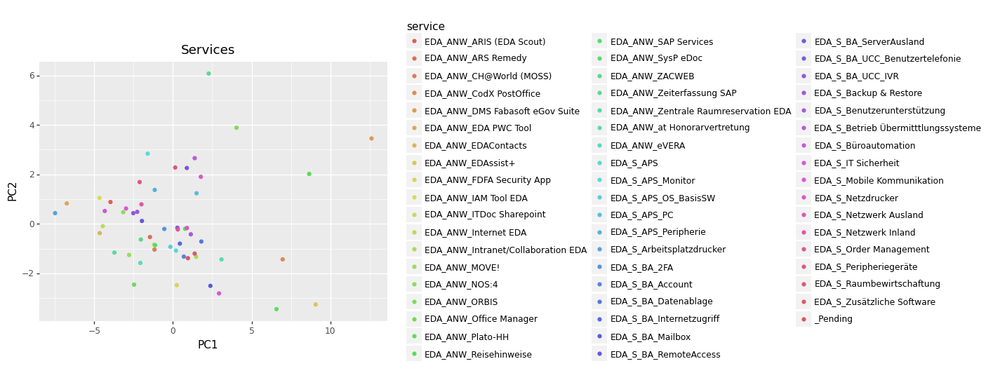

<ggplot: (-9223363242620672845)>

In [ ]:
from plotnine import *

ggplot(pca_df, aes(x='pc1', y='pc2', color='service'))  + geom_point() + xlab("PC1") + ylab("PC2") + ggtitle("Services")
    # scale_color_brewer(type='diverging', palette=4) +\
    

**Cluster the points**

In [ ]:
#service_df.transpose()

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=3, min_samples=2).fit(service_df.transpose())
labels = db.labels_

In [ ]:
db.labels_

array([-1,  0,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1,  0,  0,  0, -1, -1, -1, -1,  0,  0,  0,  0,  0, -1, -1,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0, -1,  0,  0])

In [ ]:
service_df.transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
EDA_ANW_ARIS (EDA Scout),0.706394,-1.171009,0.073806,0.021667,-1.393476,0.018206,1.127550,0.289574,-0.893930,1.035791,0.302287,0.146716,2.031123,0.648827,0.404885,0.651211,0.374464,0.646609,1.823911,1.517716,-0.214218,-0.213074,0.937293,-0.522243,2.140770,0.414460,0.393602,-0.469533,0.035602,-0.589399,-1.006157,-0.023332,0.224028,-0.293880,1.277480,-0.003338,-0.488952,1.087804,-1.268275,0.510078,...,0.037497,-1.284204,-0.369523,-0.275821,-0.524765,-0.333995,-0.740745,0.925534,-0.051723,0.411461,0.707444,1.492233,0.603006,-0.288180,-0.223284,-0.166254,0.805340,-1.211424,0.457349,-1.304837,0.596357,1.138890,-1.235947,0.272659,0.135667,-1.922194,-0.090747,0.955397,1.256217,-1.710420,0.742713,-0.468307,-1.732018,-0.309642,1.980960,0.347131,-0.324488,-0.281473,0.690270,0.650197
EDA_ANW_ARS Remedy,1.017536,-0.523286,-0.157799,-0.463762,-0.376269,-0.160347,-0.290961,0.565726,0.374028,1.142711,0.005154,0.189028,0.969783,-0.678896,0.826080,0.362367,0.162491,0.531113,0.809474,0.539046,-0.421810,-0.086735,0.845729,-0.414370,0.847116,0.531388,0.433911,-0.374422,0.231925,-0.227591,-0.445099,0.072043,0.291851,-1.348306,1.354940,-0.113051,-0.092316,1.011658,-0.627156,0.275993,...,0.095473,-0.549651,-0.248452,-0.579426,-0.222368,-0.560380,-0.209288,-0.119020,0.391840,0.448103,0.721162,1.175441,0.352154,0.497637,0.301462,0.213989,0.905156,-0.392028,0.157645,-0.707384,0.560528,0.887582,-0.501651,0.230754,0.225155,-0.624434,0.085156,0.268180,0.950854,-0.926127,0.393469,-0.149354,-0.619449,-0.283326,0.738696,0.947438,-0.849363,-0.870719,0.852412,0.710829
EDA_ANW_CH@World (MOSS),1.023533,-0.673993,-0.058054,-0.733051,-0.382041,-0.178579,-0.222525,0.487312,0.287835,1.518691,0.073301,0.469617,1.312896,-0.607685,0.866557,0.601994,0.140301,0.762738,0.959083,0.651814,-0.549017,0.030482,0.992812,-0.521943,1.120696,0.479167,0.423799,-0.342510,0.362808,-0.276774,-0.290868,0.266337,0.374720,-1.289263,1.543549,-0.341511,-0.162564,1.265933,-0.773975,0.538396,...,0.022952,-0.680859,-0.518414,-0.645281,-0.009784,-0.529102,-0.355999,0.227152,0.270847,0.260160,0.588945,0.902260,0.346861,0.492994,0.250648,-0.000897,0.903068,-0.506409,0.308809,-0.758734,0.424043,1.114539,-0.429313,0.206674,0.313818,-0.881949,0.126753,0.073753,1.190691,-1.079549,0.394648,-0.511744,-0.683479,-0.180525,1.149812,0.943949,-0.796786,-0.900019,0.845888,0.793363
EDA_ANW_CodX PostOffice,0.833248,-0.939755,0.861760,-0.722065,0.728369,-0.073807,0.031272,-0.194351,0.031037,1.268850,0.417730,0.847597,0.907989,-1.452022,1.251983,0.631240,0.633974,0.670246,1.126133,0.707093,-0.686272,-1.220755,0.912828,-0.014971,1.038355,-0.158979,0.481845,-0.504222,0.475155,-0.317906,0.215718,0.790350,0.248366,-0.855424,1.767318,0.431466,0.695899,0.106548,-0.904197,1.061395,...,-0.214249,0.002850,-0.758138,-0.174060,0.645695,-0.787913,-0.671796,-0.347520,0.053959,1.078779,-0.057384,0.585037,-0.041568,0.451703,-0.027751,-0.177962,0.874292,-1.321222,0.756940,0.709485,-0.536230,0.527317,-0.553931,0.555043,1.295255,-0.961800,-0.322727,0.215630,1.261315,-0.186958,0.690620,-0.979375,-1.182374,-0.024287,0.685722,1.007178,-1.305241,-1.061154,0.313031,-0.198731
EDA_ANW_DMS Fabasoft eGov Suite,0.291764,-1.312625,1.020184,-1.280927,1.012231,0.012654,-0.484708,-0.730433,0.556097,0.719511,0.902153,0.977121,-0.001815,-2.033594,0.988313,0.082083,1.934568,0.165594,1.631295,0.659702,-0.285012,-1.841238,0.732421,0.427578,0.614730,-0.241433,1.773153,-0.557552,1.107441,-0.609740,0.551789,1.212020,-0.287709,-0.747512,2.276825,0.766337,2.091469,-0.885245,-0.837416,1.184416,...,-0.876550,0.095679,-0.249435,-0.743241,0.710699,-1.431858,-0.482170,-0.747987,0.041527,1.232308,0.066050,0.815485,-0.372745,1.296849,-0.389877,-0.888501,1.165622,-1.469627,1.133221,1.527604